In [1]:
# """
# Minimal unpacking of coarse screening results.
# Only essential fields for analysis.
# """

# import pickle
# import numpy as np
# import pandas as pd
# from pathlib import Path
# import gc


# def parse_alpha(alpha_val):
#     """Parse alpha value, handling 'determ' string."""
#     if alpha_val == "determ":
#         return 1000.0
#     try:
#         return float(alpha_val) if alpha_val is not None else np.nan
#     except (ValueError, TypeError):
#         return np.nan


# SPEAKER_KEY_TO_MODEL = {
#     "literal": "literal", "inf_T": "inf_T", "inf_F": "inf_F",
#     "persp_T": "persp_T", "persp_F": "persp_F",
#     "persm_T": "persm_T", "persm_F": "persm_F",
# }

# FITTED_KEY_TO_MODEL = {
#     "literal_fitted": "literal", "inf_T_fitted": "inf_T", "inf_F_fitted": "inf_F",
#     "persp_T_fitted": "persp_T", "persp_F_fitted": "persp_F",
#     "persm_T_fitted": "persm_T", "persm_F_fitted": "persm_F",
# }


# def unpack_file(filepath: Path) -> pd.DataFrame:
#     """
#     Unpack a single result file into minimal DataFrame.
    
#     Columns:
#         N, M, theta, T          - design parameters
#         obs_id, utt_id          - identifiers (for tracing back to raw data)
#         true_model, fitted_model - model names
#         true_ll, fitted_ll      - log-likelihoods
#         fitted_alpha            - optimal alpha from fitting
#         gap                     - true_ll - fitted_ll
#     """
#     with open(filepath, "rb") as f:
#         obs_data = pickle.load(f)
    
#     meta = obs_data.get("_metadata", {})
#     N, M = meta.get("n"), meta.get("m")
#     Ts = obs_data["config"]["Ts"]
#     thetas = obs_data["config"]["thetas"]
    
#     rows = []
    
#     for theta in thetas:
#         for obs_id, obs_info in enumerate(obs_data["observations"][theta]):
#             if obs_info["utterances"] is None:
#                 continue
            
#             for speaker_key, alpha_dict in obs_info["utterances"].items():
#                 true_model = SPEAKER_KEY_TO_MODEL.get(speaker_key)
#                 if true_model is None:
#                     continue
                
#                 for _, utt_records in alpha_dict.items():
#                     for utt_id, utt_rec in enumerate(utt_records):
#                         true_ll_dict = utt_rec.get("log_lik_true_speaker", {})
#                         fitted_lls = utt_rec.get("log_lik_all_speaker", {})
#                         if not fitted_lls:
#                             continue
                        
#                         for T in Ts:
#                             true_ll = true_ll_dict.get(T, np.nan)
                            
#                             for fitted_key, fitted_data in fitted_lls.items():
#                                 fitted_model = FITTED_KEY_TO_MODEL.get(fitted_key)
#                                 if fitted_model is None:
#                                     continue
                                
#                                 fitted_ll = fitted_data.get("max_log_lik", {}).get(T, np.nan)
#                                 fitted_alpha = parse_alpha(fitted_data.get("optimal_alpha", {}).get(T))
#                                 gap = true_ll - fitted_ll if np.isfinite(true_ll) and np.isfinite(fitted_ll) else np.nan
                                
#                                 rows.append((
#                                     N, M, theta, T, obs_id, utt_id,
#                                     true_model, fitted_model,
#                                     true_ll, fitted_ll, fitted_alpha, gap
#                                 ))
    
#     del obs_data
#     gc.collect()
    
#     return pd.DataFrame(rows, columns=[
#         "N", "M", "theta", "T", "obs_id", "utt_id",
#         "true_model", "fitted_model",
#         "true_ll", "fitted_ll", "fitted_alpha", "gap"
#     ])


# def unpack_all(results_dir: str, pattern: str = "screen_N*_M*_T*.pkl") -> pd.DataFrame:
#     """Unpack all result files."""
#     files = sorted(Path(results_dir).glob(pattern))
#     if not files:
#         raise FileNotFoundError(f"No files matching '{pattern}' in {results_dir}")
    
#     print(f"Found {len(files)} files")
#     dfs = []
#     for f in files:
#         print(f"  {f.name}...", end=" ")
#         df = unpack_file(f)
#         print(f"{len(df):,} rows")
#         dfs.append(df)
    
#     df_all = pd.concat(dfs, ignore_index=True)
#     print(f"Total: {len(df_all):,} rows, {df_all.memory_usage(deep=True).sum()/1e9:.2f} GB")
#     return df_all


# # =============================================================================
# # RELOAD CSV
# # =============================================================================

# def load_csv(filepath: str) -> pd.DataFrame:
#     """Load saved CSV with correct dtypes."""
#     return pd.read_csv(filepath, dtype={
#         "N": "int8", "M": "int8", "theta": "float32", "T": "int8",
#         "obs_id": "int16", "utt_id": "int16",
#         "true_model": "category", "fitted_model": "category",
#         "true_ll": "float32", "fitted_ll": "float32",
#         "fitted_alpha": "float32", "gap": "float32"
#     })


# # =============================================================================
# # DERIVE MISMATCH INDICATORS (for analysis)
# # =============================================================================

# def add_mismatch_indicators(df: pd.DataFrame) -> pd.DataFrame:
#     """Add mismatch indicators derived from model names."""
#     # Model info lookup
#     goal_map = {"literal": 0, "inf_T": 1, "inf_F": 1, "persp_T": 2, "persp_F": 2, "persm_T": 3, "persm_F": 3}
#     update_map = {"literal": -1, "inf_T": 1, "inf_F": 0, "persp_T": 1, "persp_F": 0, "persm_T": 1, "persm_F": 0}
    
#     df = df.copy()
#     df["true_goal"] = df["true_model"].map(goal_map).astype("int8")
#     df["fitted_goal"] = df["fitted_model"].map(goal_map).astype("int8")
#     df["true_update"] = df["true_model"].map(update_map).astype("int8")
#     df["fitted_update"] = df["fitted_model"].map(update_map).astype("int8")
    
#     df["self_fit"] = (df["true_model"] == df["fitted_model"]).astype("int8")
#     df["goal_mismatch"] = (df["true_goal"] != df["fitted_goal"]).astype("int8")
#     df["update_mismatch"] = np.where(
#         (df["true_update"] >= 0) & (df["fitted_update"] >= 0),
#         (df["true_update"] != df["fitted_update"]).astype("int8"),
#         -1
#     ).astype("int8")
#     df["both_pragmatic"] = ((df["true_goal"] > 0) & (df["fitted_goal"] > 0)).astype("int8")
    
#     return df


# if __name__ == "__main__":
#     RESULTS_DIR = "/home/users/fangke/prag_net/optimal_design/results/"
    
#     df = unpack_all(RESULTS_DIR)
#     df.to_csv("/home/users/fangke/prag_net/optimal_design/results/analysis.csv", index=False)
#     print("Saved to analysis.csv")
    
#     # Add indicators for analysis
#     df = add_mismatch_indicators(df)
#     print(f"\nColumns: {list(df.columns)}")

In [2]:
import numpy as np
import pandas as pd

df = pd.read_csv("/home/users/fangke/prag_net/optimal_design/results/analysis.csv", dtype={
    "N": "int8", "M": "int8", "theta": "float32", "T": "int8",
    "obs_id": "int16", "utt_id": "int16",
    "true_model": "category", "fitted_model": "category",
    "true_ll": "float32", "fitted_ll": "float32",
    "fitted_alpha": "float32", "gap": "float32"
})

In [3]:
# 1) "(N, M)" label (make it categorical to save memory if combos repeat a lot)
df["N_M"] = pd.Categorical(
    "(" + df["N"].astype("string") + ", " + df["M"].astype("string") + ")"
)

# 2) |theta - 0.5|
df["theta_abs"] = (df["theta"] - 0.5).abs()

# Helper to derive psi + update from a model column
def add_model_cols(df, src_col, psi_col, update_col):
    # split once: "inf_T" -> base="inf", suf="T"; "literal" -> base="literal", suf=<NA>
    base = df[src_col].astype("string").str.split("_", n=1).str[0]
    suf  = df[src_col].astype("string").str.split("_", n=1).str[1]  # <NA> for "literal"

    # psi is just the base, but ensure only allowed values and make categorical
    psi_cats = ["literal", "inf", "persp", "persm"]
    df[psi_col] = pd.Categorical(base, categories=psi_cats)

    # update: 0 if F or literal; 1 if T
    # (suf is <NA> for literal -> treat as 0)
    df[update_col] = (suf == "T").fillna(False).astype("int8")

add_model_cols(df, "true_model",   "true_psi",   "true_update")
add_model_cols(df, "fitted_model", "fitted_psi", "fitted_update")

# 3) match flags
df["psi_match"]    = (df["true_psi"]    == df["fitted_psi"]).astype("int8")
df["update_match"] = (df["true_update"] == df["fitted_update"]).astype("int8")


In [4]:
df["theta"] = df["theta"].round(1)
df["gap_alpha"] = df["fitted_alpha"] - np.where(df["true_model"].eq("literal"), 0.0, 4.0)

df.head(5)

,N,M,theta,T,obs_id,utt_id,true_model,fitted_model,true_ll,fitted_ll,...,gap,N_M,theta_abs,true_psi,true_update,fitted_psi,fitted_update,psi_match,update_match,gap_alpha
0,4,5,0.1,5,0,0,literal,literal,-12.967028,-12.967028,...,0.000000,"(4, 5)",0.4,literal,0,literal,0,1,1,0.000000
1,4,5,0.1,5,0,0,literal,inf_F,-12.967028,-12.974836,...,0.007808,"(4, 5)",0.4,literal,0,inf,0,0,1,0.100000
2,4,5,0.1,5,0,0,literal,inf_T,-12.967028,-12.933006,...,-0.034022,"(4, 5)",0.4,literal,0,inf,1,0,0,0.290710
3,4,5,0.1,5,0,0,literal,persp_F,-12.967028,-12.952479,...,-0.014549,"(4, 5)",0.4,literal,0,persp,0,0,1,0.128543
4,4,5,0.1,5,0,0,literal,persp_T,-12.967028,-12.965542,...,-0.001486,"(4, 5)",0.4,literal,0,persp,1,0,0,0.100000


In [5]:
df.rename(columns={"gap": "ll_gap"}, inplace=True)


In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

FITTED_ORDER = ["literal", "inf_F", "inf_T", "persp_F", "persp_T", "persm_F", "persm_T"]

def plot_gap_grid_T_theta(
    df,
    true_model: str,
    value_col: str,          # "ll_gap" or "gap_alpha"
    agg: str = "mean",
    cmap: str = "bwr",       # blue-white-red, white at 0
    annotate: bool = True,
    annot_fontsize: int = 6,
):
    # Use theta10 if available (avoids float weirdness), else theta
    theta_col = "theta10" if "theta10" in df.columns else "theta"

    # Filter and keep only needed columns
    sub = df.loc[df["true_model"].eq(true_model), [theta_col, "T", "N_M", "fitted_model", value_col]].copy()
    sub["fitted_model"] = pd.Categorical(sub["fitted_model"], categories=FITTED_ORDER, ordered=True)

    theta_vals = np.array(sorted(sub[theta_col].dropna().unique()))
    T_vals     = np.array(sorted(sub["T"].dropna().unique()))

    nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))

    # Aggregate once (what gets plotted)
    gb = sub.groupby([theta_col, "T", "N_M", "fitted_model"], observed=True)[value_col]
    agg_df = (gb.mean() if agg == "mean" else gb.agg(agg)).reset_index()

    # Symmetric diverging scale around 0 so |x| => same intensity
    vals = agg_df[value_col].to_numpy()
    A = float(np.nanmax(np.abs(vals))) if np.isfinite(vals).any() else 1.0
    norm = mcolors.TwoSlopeNorm(vmin=-A, vcenter=0.0, vmax=A)

    nrows, ncols = len(theta_vals), len(T_vals)
    fig, axes = plt.subplots(nrows, ncols, figsize=(max(10, 2.8*ncols), max(6, min(0.22*len(nm_order)*nrows, 30))),
                             sharex=True, sharey=True, constrained_layout=True)
    axes = np.atleast_2d(axes)

    def theta_label(th):
        return f"{th/10:.1f}" if theta_col == "theta10" else f"{th}"

    last_im = None
    for r, th in enumerate(theta_vals):
        for c, t in enumerate(T_vals):
            ax = axes[r, c]
            g = agg_df[(agg_df[theta_col].eq(th)) & (agg_df["T"].eq(t))]

            pivot = (
                g.pivot(index="N_M", columns="fitted_model", values=value_col)
                 .reindex(index=nm_order, columns=FITTED_ORDER)
            )
            data = pivot.to_numpy()

            last_im = ax.imshow(data, aspect="auto", origin="upper", interpolation="nearest", cmap=cmap, norm=norm)

            if r == 0:
                ax.set_title(f"T={t}")
            if c == 0:
                ax.set_ylabel(f"θ={theta_label(th)}\nN_M")
            if r == nrows - 1:
                ax.set_xlabel("fitted_model")

            ax.set_xticks(np.arange(len(FITTED_ORDER)))
            ax.set_xticklabels(FITTED_ORDER, rotation=45, ha="right")
            ax.set_yticks(np.arange(len(nm_order)))
            ax.set_yticklabels(nm_order)

            if annotate and data.size:
                for i in range(data.shape[0]):
                    for j in range(data.shape[1]):
                        v = data[i, j]
                        if np.isfinite(v):
                            ax.text(j, i, f"{v:.2f}", ha="center", va="center", fontsize=annot_fontsize)

    fig.suptitle(f"{value_col} heatmaps (agg={agg}) | true_model={true_model}\nGrid: columns=T, rows={theta_col}", y=1.02)
    if last_im is not None:
        fig.colorbar(last_im, ax=axes.ravel().tolist(), shrink=0.9, label=f"{agg}({value_col})")

    return fig

/tmp/ipykernel_27424/956237884.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))


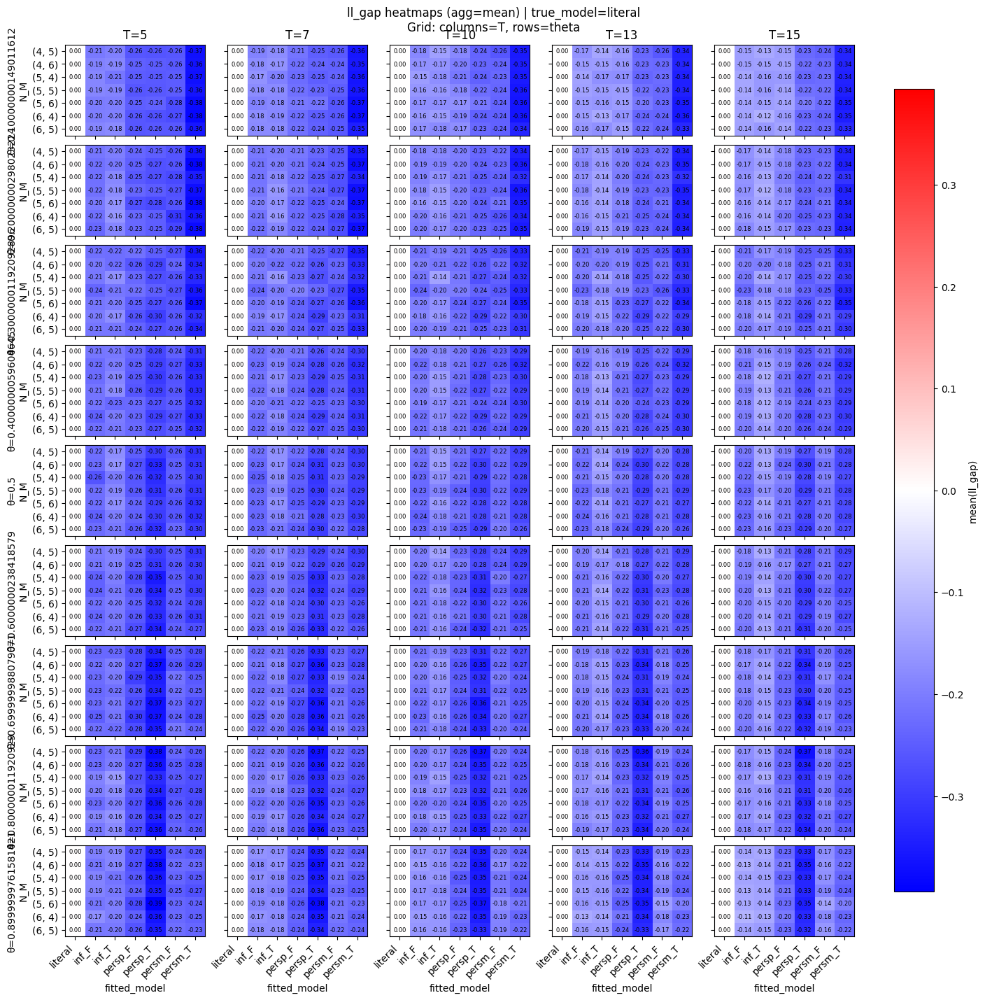

/tmp/ipykernel_27424/956237884.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))


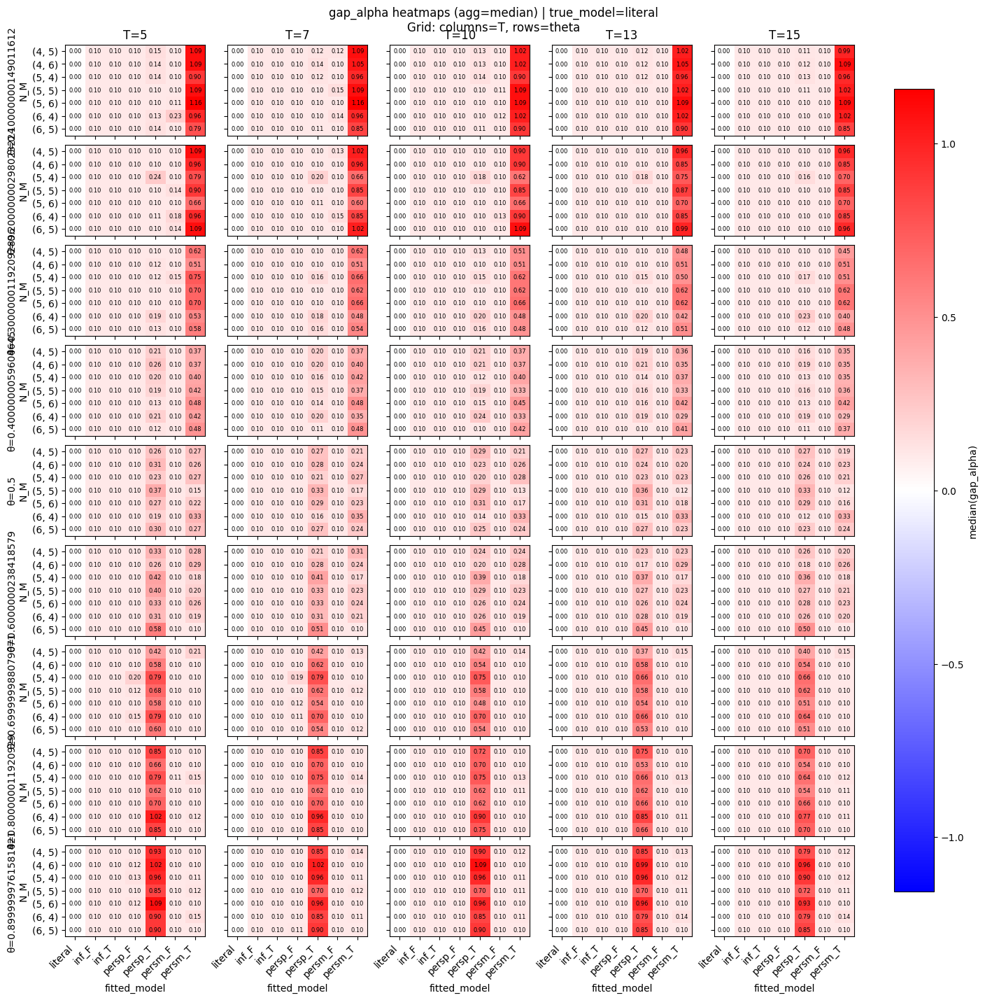

In [7]:
fig = plot_gap_grid_T_theta(df, true_model="literal", value_col="ll_gap", agg = "mean")
plt.show()

fig = plot_gap_grid_T_theta(df, true_model="literal", value_col="gap_alpha", agg = "median")
plt.show()

/tmp/ipykernel_27424/956237884.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))


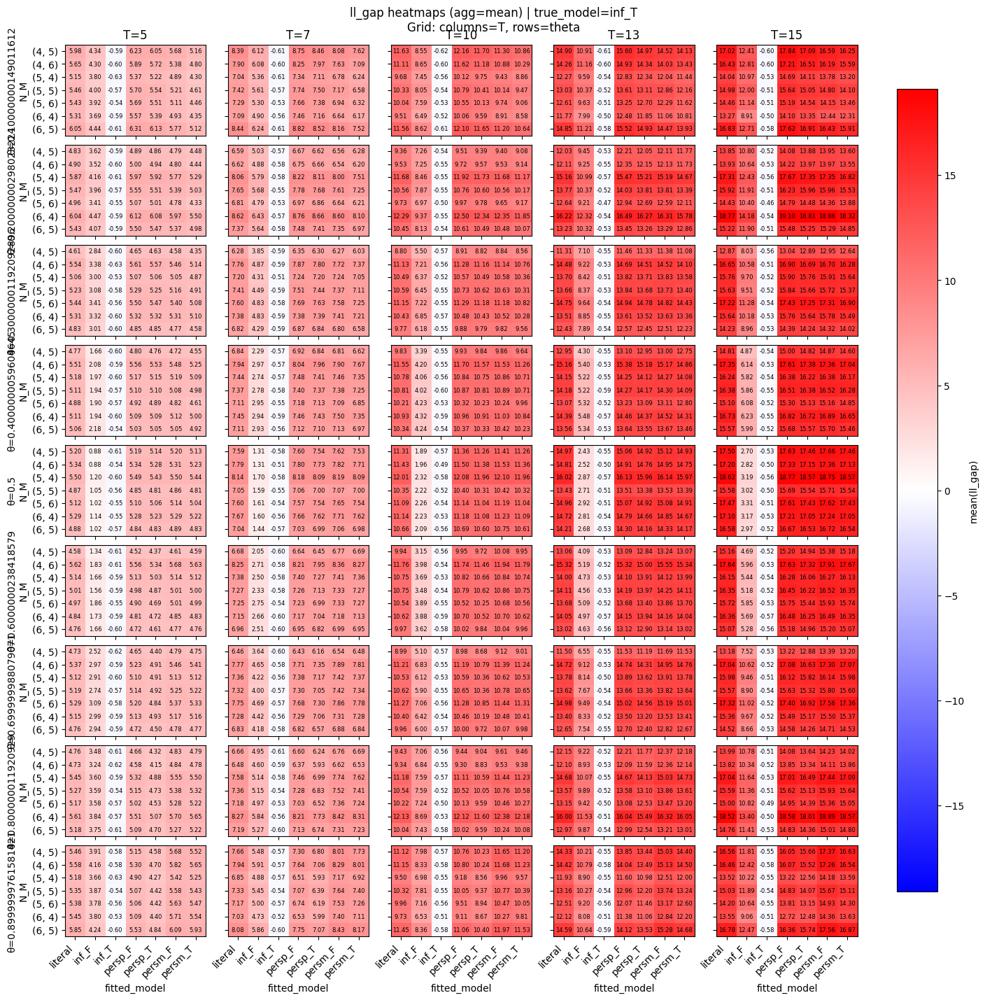

/tmp/ipykernel_27424/956237884.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))


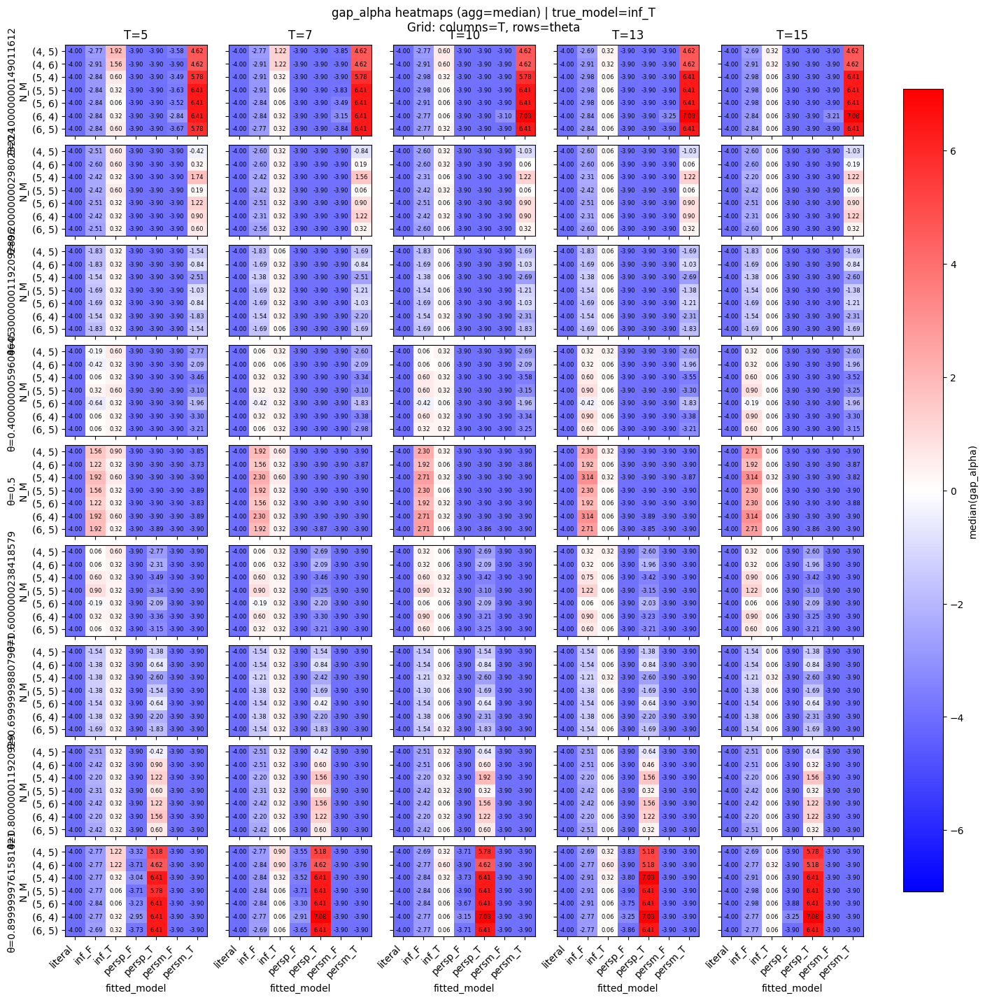

In [8]:
fig = plot_gap_grid_T_theta(df, true_model="inf_T", value_col="ll_gap", agg = "mean")
plt.show()

fig = plot_gap_grid_T_theta(df, true_model="inf_T", value_col="gap_alpha", agg = "median")
plt.show()

/tmp/ipykernel_27424/956237884.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))


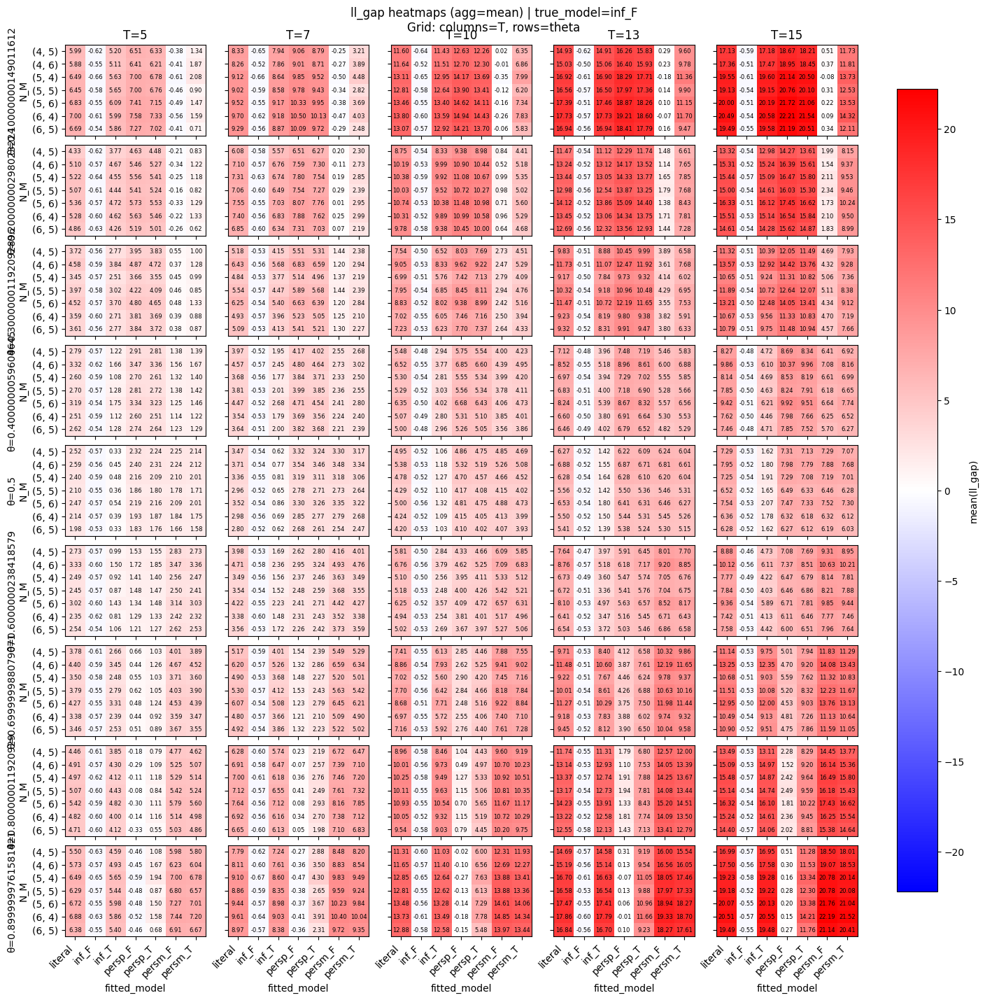

/tmp/ipykernel_27424/956237884.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))


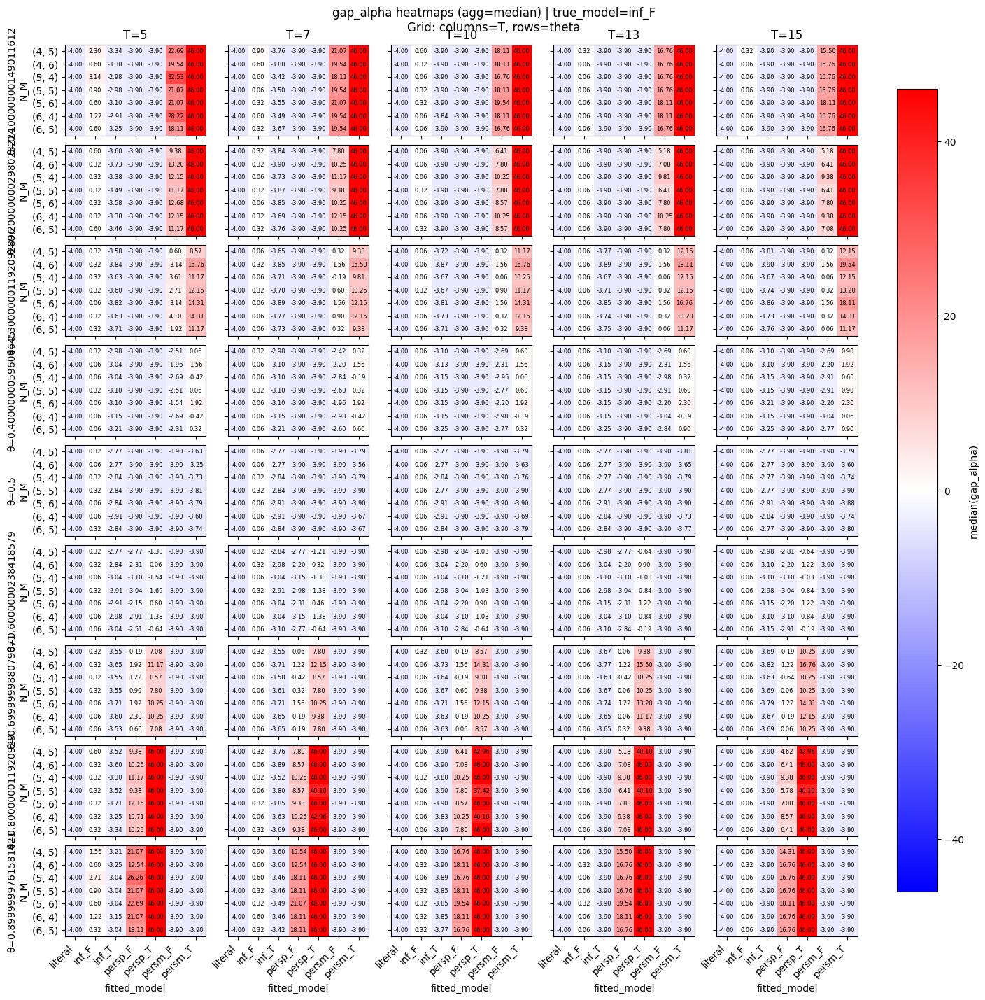

In [9]:
fig = plot_gap_grid_T_theta(df, true_model="inf_F", value_col="ll_gap", agg = "mean")
plt.show()

fig = plot_gap_grid_T_theta(df, true_model="inf_F", value_col="gap_alpha", agg = "median")
plt.show()

/tmp/ipykernel_27424/956237884.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))


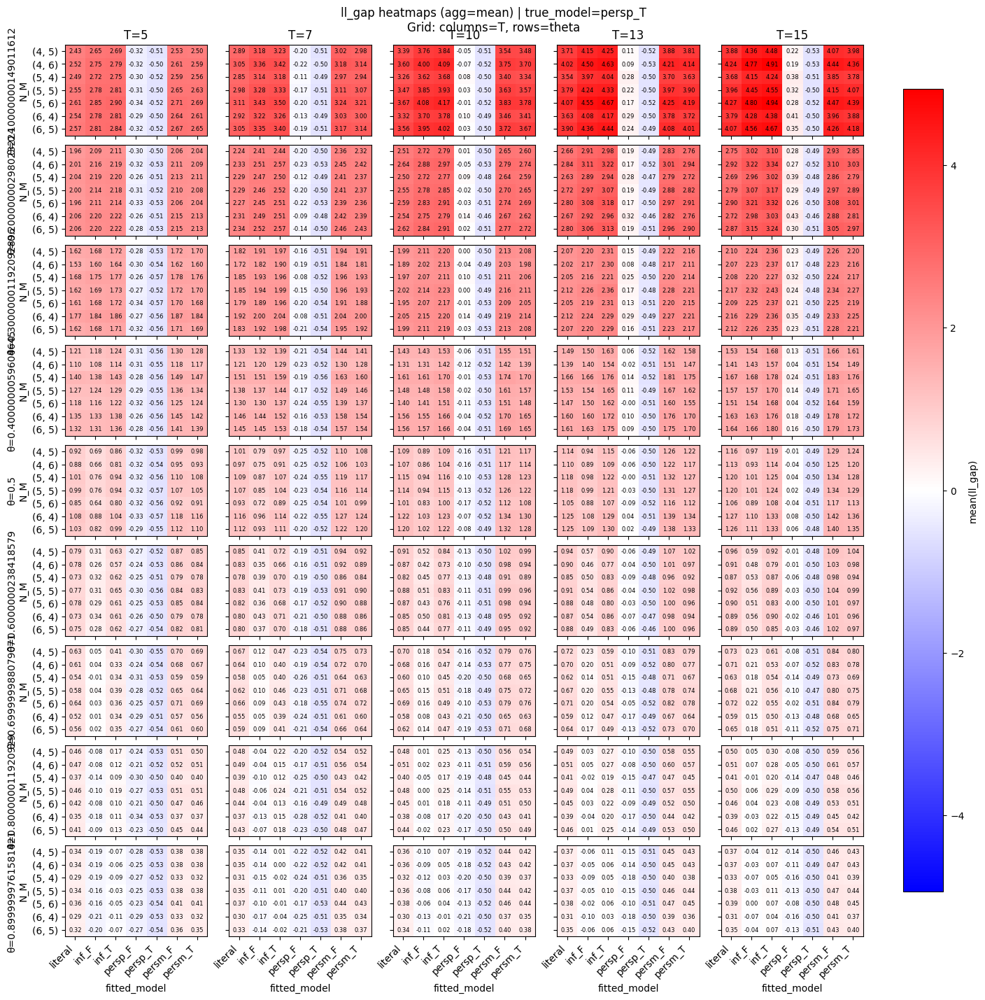

/tmp/ipykernel_27424/956237884.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))


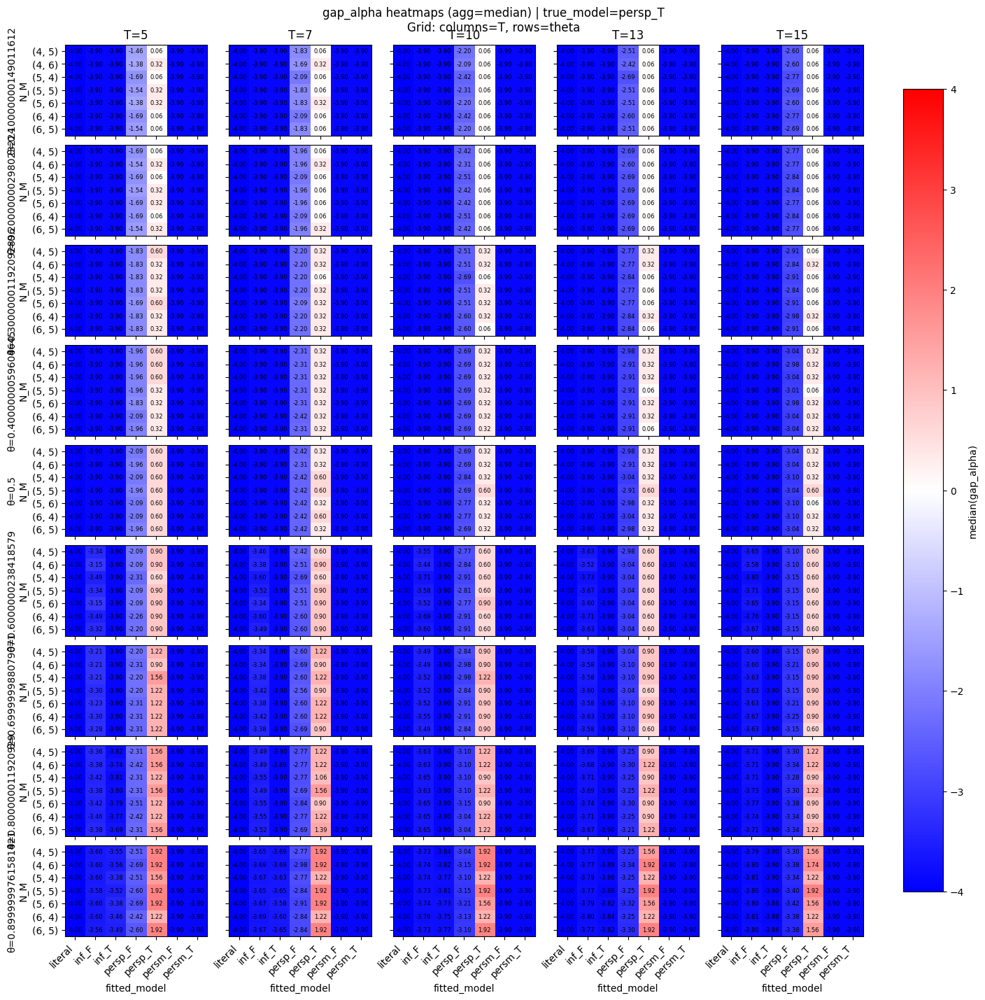

In [10]:
fig = plot_gap_grid_T_theta(df, true_model="persp_T", value_col="ll_gap", agg = "mean")
plt.show()

fig = plot_gap_grid_T_theta(df, true_model="persp_T", value_col="gap_alpha", agg = "median")
plt.show()

/tmp/ipykernel_27424/956237884.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))


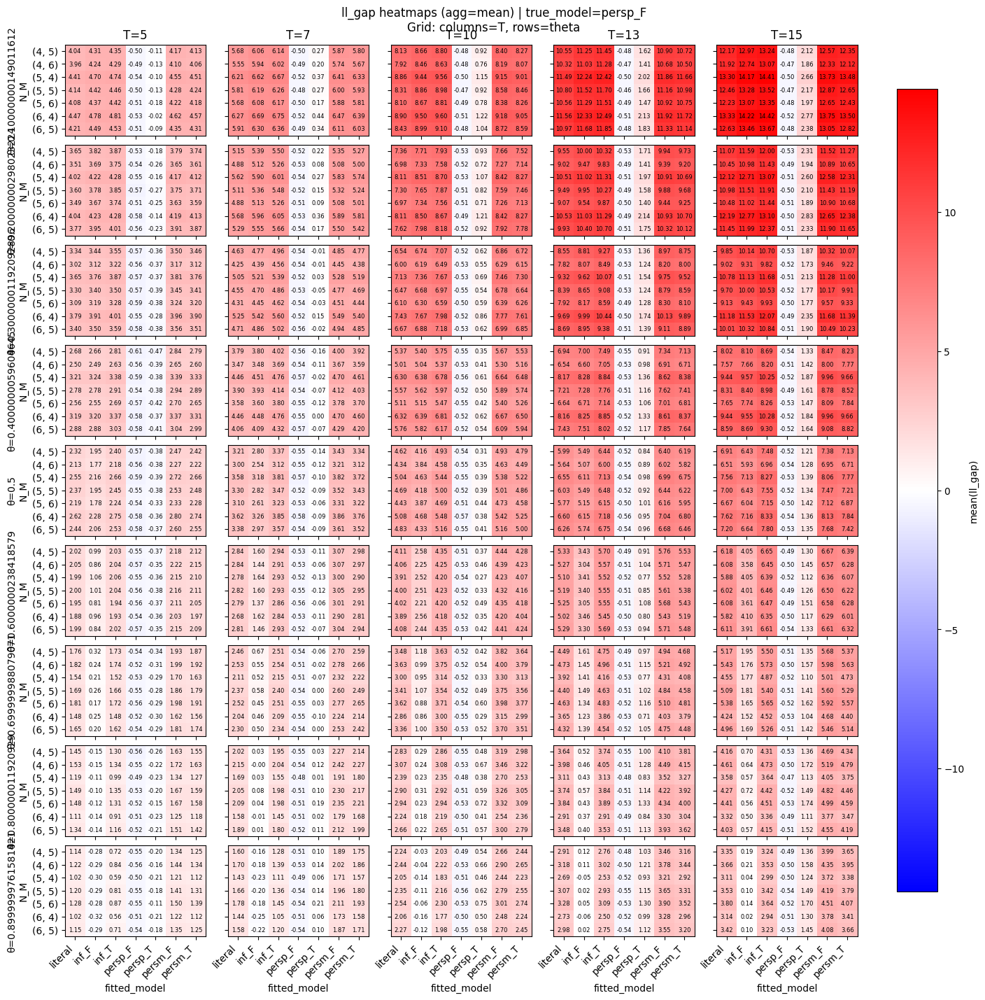

/tmp/ipykernel_27424/956237884.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))


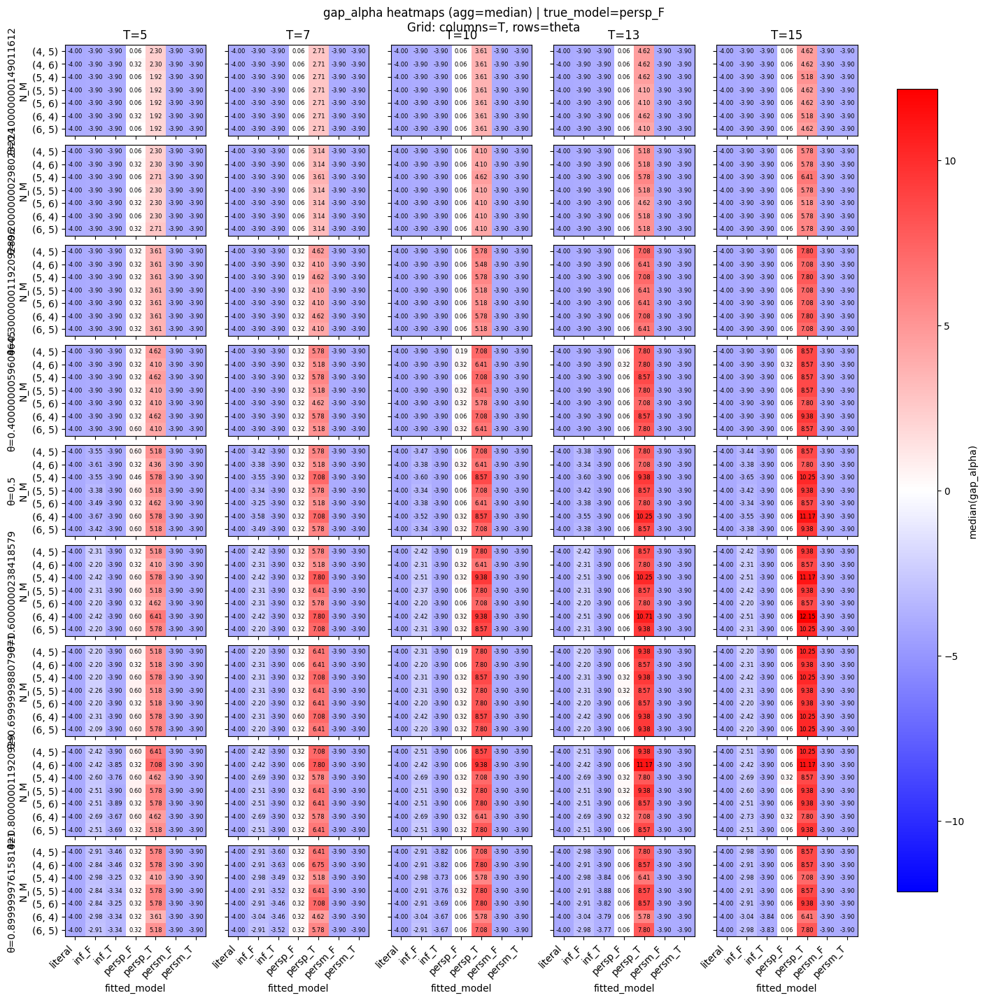

In [11]:
fig = plot_gap_grid_T_theta(df, true_model="persp_F", value_col="ll_gap", agg = "mean")
plt.show()

fig = plot_gap_grid_T_theta(df, true_model="persp_F", value_col="gap_alpha", agg = "median")
plt.show()

/tmp/ipykernel_27424/956237884.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))


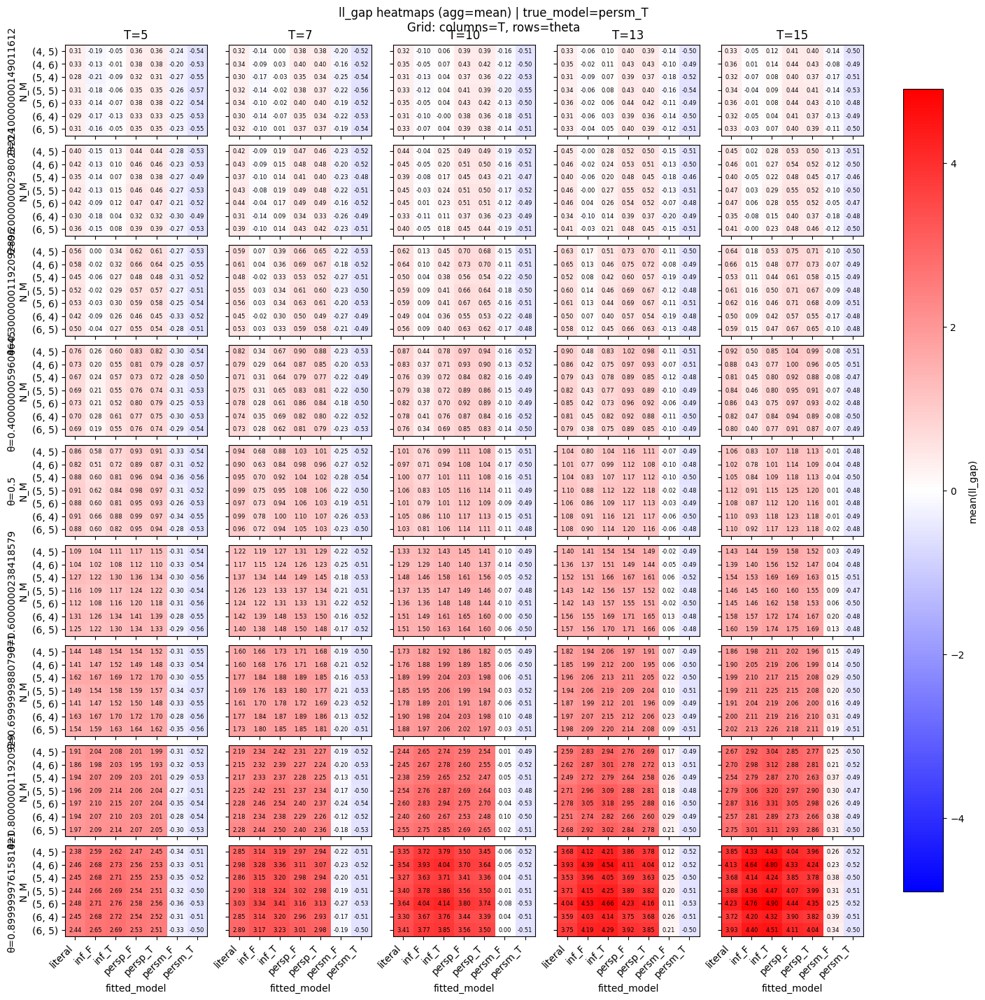

/tmp/ipykernel_27424/956237884.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))


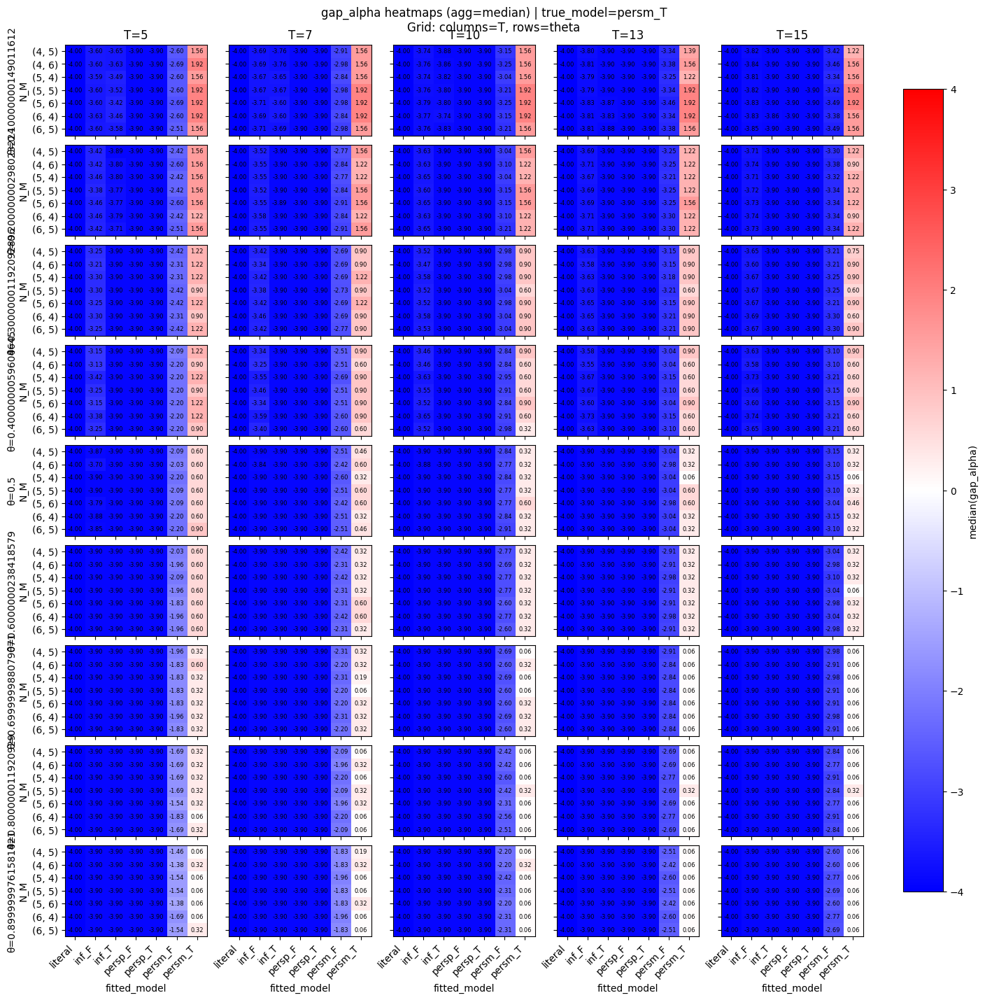

In [12]:
fig = plot_gap_grid_T_theta(df, true_model="persm_T", value_col="ll_gap", agg = "mean")
plt.show()

fig = plot_gap_grid_T_theta(df, true_model="persm_T", value_col="gap_alpha", agg = "median")
plt.show()

/tmp/ipykernel_27424/956237884.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))


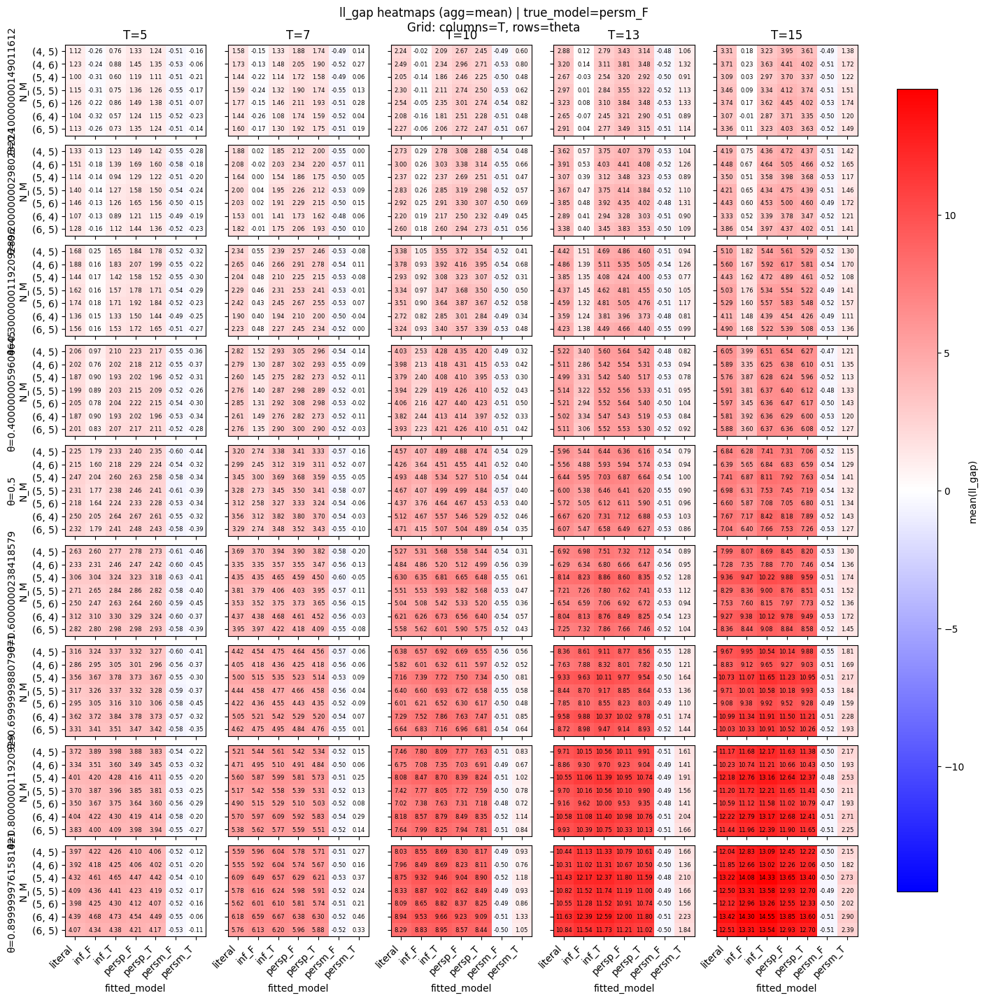

/tmp/ipykernel_27424/956237884.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  nm_order = sub["N_M"].cat.categories if pd.api.types.is_categorical_dtype(sub["N_M"]) else pd.Index(sorted(sub["N_M"].dropna().unique()))


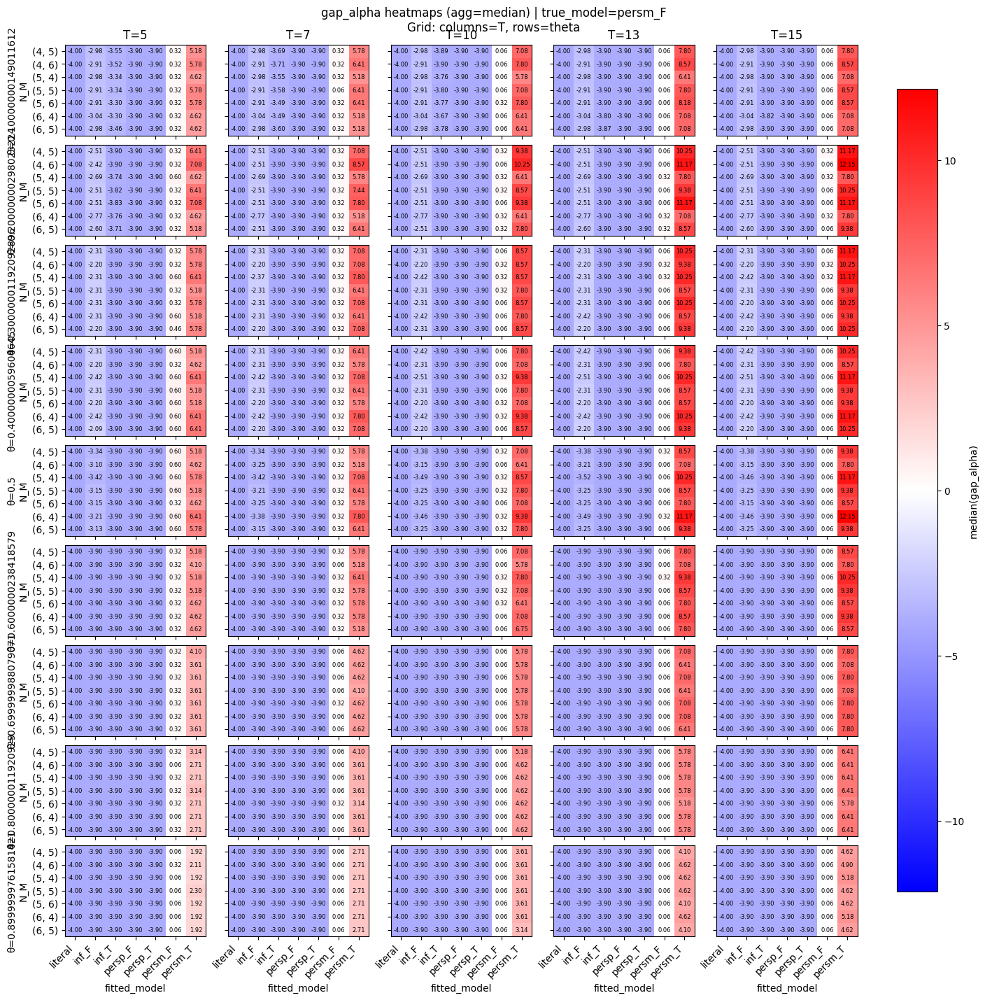

In [13]:
fig = plot_gap_grid_T_theta(df, true_model="persm_F", value_col="ll_gap", agg = "mean")
plt.show()

fig = plot_gap_grid_T_theta(df, true_model="persm_F", value_col="gap_alpha", agg = "median")
plt.show()

/tmp/ipykernel_24721/2871920929.py:28: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(sub["N_M"]):


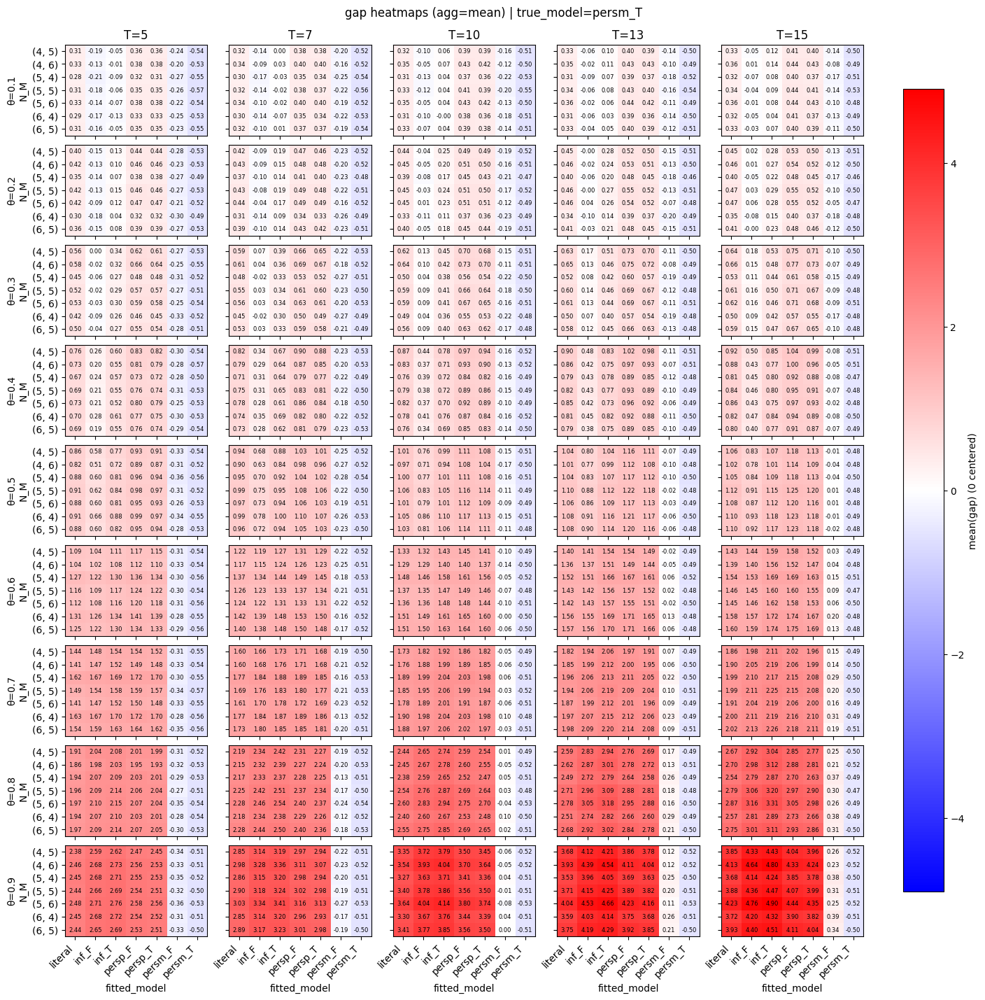

/tmp/ipykernel_24721/2871920929.py:28: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(sub["N_M"]):


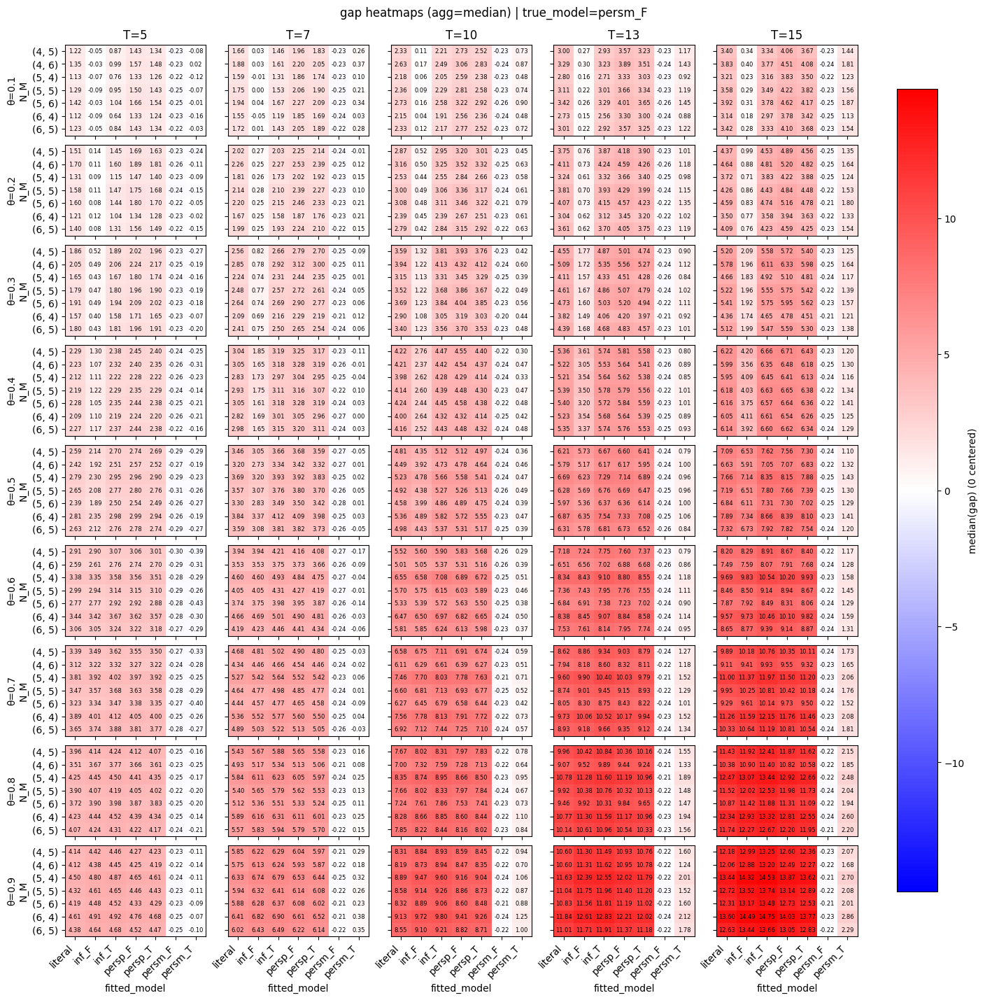

/tmp/ipykernel_16214/1632784555.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cross_lik = df_theta[df_theta["T"] == 15].groupby(["true_model", "fitted_model"])["gap"].mean().unstack()


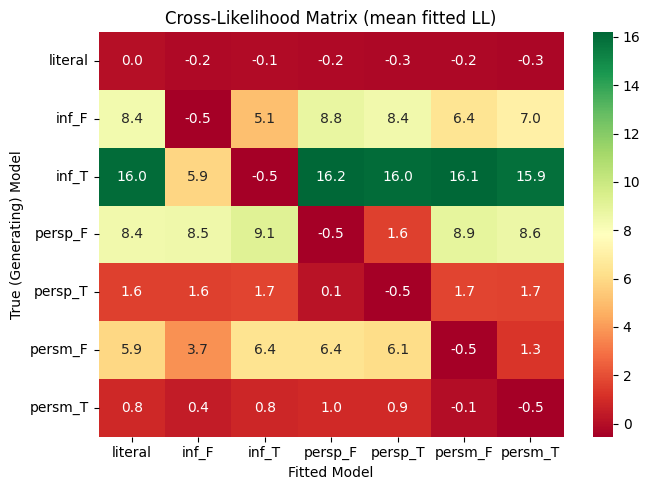

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

# Average cross-likelihood matrix
cross_lik = df_theta[df_theta["T"] == 15].groupby(["true_model", "fitted_model"])["gap"].mean().unstack()

model_order = ["literal", "inf_F", "inf_T", "persp_F", "persp_T", "persm_F", "persm_T"]
cross_lik = cross_lik.reindex(index=model_order, columns=model_order)

fig, ax = plt.subplots(figsize=(7, 5))
sns.heatmap(cross_lik, annot=True, fmt=".1f", cmap="RdYlGn", ax=ax)
ax.set_xlabel("Fitted Model")
ax.set_ylabel("True (Generating) Model")
ax.set_title("Cross-Likelihood Matrix (mean fitted LL)")
plt.tight_layout()
plt.show()

/tmp/ipykernel_16214/3883372250.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cross_lik = df_theta[df_theta["T"] == 15].groupby(["true_model", "fitted_model"])["fitted_alpha"].mean().unstack()


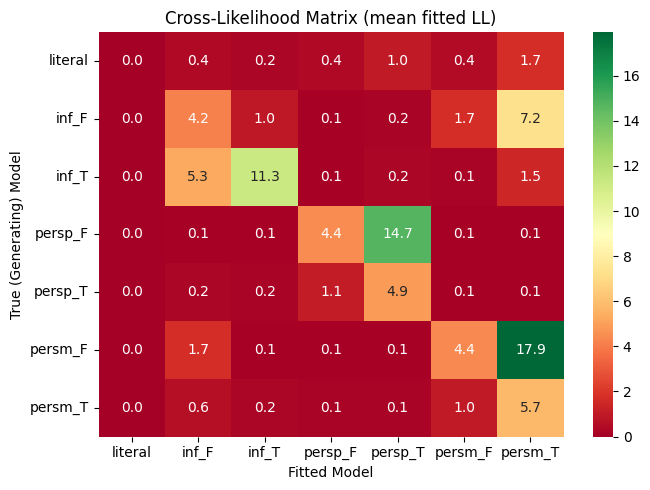

In [20]:
import seaborn as sns

# Average cross-likelihood matrix
cross_lik = df_theta[df_theta["T"] == 15].groupby(["true_model", "fitted_model"])["fitted_alpha"].mean().unstack()

model_order = ["literal", "inf_F", "inf_T", "persp_F", "persp_T", "persm_F", "persm_T"]
cross_lik = cross_lik.reindex(index=model_order, columns=model_order)

fig, ax = plt.subplots(figsize=(7, 5))
sns.heatmap(cross_lik, annot=True, fmt=".1f", cmap="RdYlGn", ax=ax)
ax.set_xlabel("Fitted Model")
ax.set_ylabel("True (Generating) Model")
ax.set_title("Cross-Likelihood Matrix (mean fitted LL)")
plt.tight_layout()
plt.show()